# 1. Setup


In [1]:
from huggingface_hub import notebook_login

notebook_login()

In [1]:
hf_username = "samitizerxu"

In [2]:
import wandb
wandb.login()

Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: samitizerxu. Use `wandb login --relogin` to force relogin


True

In [3]:
import os
os.environ["WANDB_PROJECT"]="kelp-segmentation"

# 2. Dataset Loading


In [4]:
from datasets import load_dataset

ds = load_dataset("kelp_data", name="rgbagg_swin_nir_int",trust_remote_code=True)

In [5]:
ds = ds.shuffle(seed=1)
ds = ds["train"].train_test_split(test_size=0.35)
train_ds = ds["train"]
test_ds = ds["test"]

## Image processor & data augmentation

In [6]:
from torchvision.transforms import ColorJitter, RandomAffine, InterpolationMode, RandomHorizontalFlip, RandomVerticalFlip, Compose
from transformers import (
    SegformerImageProcessor,
)
import torch

processor = SegformerImageProcessor(do_reduce_labels=True)
transform_fn = Compose([
    ColorJitter(brightness=0.25, contrast=0.25, saturation=0.25, hue=0.1),
    RandomAffine(degrees=90,translate=(0.3,0.3),scale=(0.7,1.3),interpolation=InterpolationMode.BILINEAR ),
    RandomHorizontalFlip(p=0.5),
    RandomVerticalFlip(p=0.5)
])

def train_transforms(example_batch):
    state = torch.get_rng_state()
    transform_fn = Compose([
        ColorJitter(brightness=0.25, contrast=0.25, saturation=0.25, hue=0.1),
        RandomAffine(degrees=90,translate=(0.3,0.3),scale=(0.7,1.3),interpolation=InterpolationMode.BILINEAR ),
        RandomHorizontalFlip(p=0.5),
        RandomVerticalFlip(p=0.5)
    ])
    images = [transform_fn(x) for x in example_batch['pixel_values']]
    torch.set_rng_state(state)
    transform_fn = Compose([
        ColorJitter(brightness=0.25, contrast=0.25, saturation=0.25, hue=0.1),
        RandomAffine(degrees=90,translate=(0.3,0.3),scale=(0.7,1.3),interpolation=InterpolationMode.BILINEAR ),
        RandomHorizontalFlip(p=0.5),
        RandomVerticalFlip(p=0.5)
    ])
    labels = [x for x in example_batch['label']]
    inputs = processor(images, labels)
    return inputs


def val_transforms(example_batch):
    images = [x for x in example_batch['pixel_values']]
    labels = [x for x in example_batch['label']]
    inputs = processor(images, labels)
    return inputs


# Set transforms
train_ds.set_transform(train_transforms)
test_ds.set_transform(val_transforms)

2024-01-21 12:33:09.739387: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-01-21 12:33:09.764146: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-01-21 12:33:09.764168: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-01-21 12:33:09.764814: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-01-21 12:33:09.769255: I tensorflow/core/platform/cpu_feature_guar

# 3. Fine-tune


In [8]:
from transformers import SegformerForSemanticSegmentation, SegformerConfig

id2label = {
    1: 'kelp',
}

label2id = {
    'kelp': 1,
}
pretrained_model_name = "nvidia/mit-b1"

model = SegformerForSemanticSegmentation.from_pretrained(
    pretrained_model_name,
    id2label=id2label,
    label2id=label2id,
    hidden_dropout_prob=0.2,
    attention_probs_dropout_prob=0.2,
)

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/mit-b1 and are newly initialized: ['decode_head.linear_c.2.proj.weight', 'decode_head.linear_c.3.proj.weight', 'decode_head.batch_norm.running_mean', 'decode_head.linear_c.0.proj.weight', 'decode_head.linear_c.3.proj.bias', 'decode_head.classifier.weight', 'decode_head.batch_norm.num_batches_tracked', 'decode_head.linear_c.0.proj.bias', 'decode_head.linear_fuse.weight', 'decode_head.batch_norm.running_var', 'decode_head.batch_norm.bias', 'decode_head.linear_c.1.proj.weight', 'decode_head.linear_c.2.proj.bias', 'decode_head.linear_c.1.proj.bias', 'decode_head.classifier.bias', 'decode_head.batch_norm.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


## Set up the Trainer

In [9]:
from transformers import TrainingArguments

epochs = 40
lr = 0.00006
batch_size = 8

hub_model_id = "segformer-b1-kelp-rgb-agg-imgaug-jan-21"

training_args = TrainingArguments(
    "segformer-b1-kelp-rgb-agg-imgaug-jan-21",
    learning_rate=lr,
    num_train_epochs=epochs,
    per_device_train_batch_size=batch_size,
    per_device_eval_batch_size=batch_size,
    save_total_limit=5,
    evaluation_strategy="steps",
    save_strategy="steps",
    save_steps=30,
    eval_steps=30,
    report_to='wandb',
    metric_for_best_model='eval_iou_kelp',
    logging_steps=1,
    eval_accumulation_steps=5,
    load_best_model_at_end=True,
    push_to_hub=True,
    warmup_steps=300,
    weight_decay=0.1,
    hub_model_id=hub_model_id,
    hub_strategy="end",
    run_name="segformer-b1-kelp-rgb-agg-imgaug-jan-21"
)

In [10]:
import torch
from torch import nn
import evaluate
import multiprocessing

metric = evaluate.load("mean_iou")

def compute_metrics(eval_pred):
  with torch.no_grad():
    logits, labels = eval_pred
    logits_tensor = torch.from_numpy(logits)
    # scale the logits to the size of the label
    logits_tensor = nn.functional.interpolate(
        logits_tensor,
        size=labels.shape[-2:],
        mode="bilinear",
        align_corners=False,
    ).argmax(dim=1)

    pred_labels = logits_tensor.detach().cpu().numpy()
    metrics = metric._compute(
            predictions=pred_labels,
            references=labels,
            num_labels=len(id2label),
            reduce_labels=processor.do_reduce_labels,
        )

    # add per category metrics as individual key-value pairs
    per_category_accuracy = metrics.pop("per_category_accuracy").tolist()
    per_category_iou = metrics.pop("per_category_iou").tolist()
    print(per_category_accuracy)
    print(per_category_iou)

    metrics.update({f"accuracy_{id2label[i]}": v for i, v in enumerate(per_category_accuracy)})
    metrics.update({f"iou_{id2label[i]}": v for i, v in enumerate(per_category_iou)})
    metrics
    return metrics

In [11]:
from transformers import Trainer

trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_ds,
    eval_dataset=test_ds,
    compute_metrics=compute_metrics,
)

In [12]:
hf_dataset_identifier = 'samitizerxu/kelp_data'

In [13]:
trainer.train()

  0%|          | 0/18320 [00:00<?, ?it/s]

{'loss': 0.6486, 'learning_rate': 2.0000000000000002e-07, 'epoch': 0.0}
{'loss': 0.6499, 'learning_rate': 4.0000000000000003e-07, 'epoch': 0.0}
{'loss': 0.6475, 'learning_rate': 6.000000000000001e-07, 'epoch': 0.01}
{'loss': 0.6496, 'learning_rate': 8.000000000000001e-07, 'epoch': 0.01}
{'loss': 0.6501, 'learning_rate': 1e-06, 'epoch': 0.01}
{'loss': 0.6503, 'learning_rate': 1.2000000000000002e-06, 'epoch': 0.01}
{'loss': 0.6495, 'learning_rate': 1.4000000000000001e-06, 'epoch': 0.02}
{'loss': 0.6504, 'learning_rate': 1.6000000000000001e-06, 'epoch': 0.02}
{'loss': 0.647, 'learning_rate': 1.8e-06, 'epoch': 0.02}
{'loss': 0.6481, 'learning_rate': 2e-06, 'epoch': 0.02}
{'loss': 0.6465, 'learning_rate': 2.2e-06, 'epoch': 0.02}
{'loss': 0.6465, 'learning_rate': 2.4000000000000003e-06, 'epoch': 0.03}
{'loss': 0.6468, 'learning_rate': 2.6e-06, 'epoch': 0.03}
{'loss': 0.6467, 'learning_rate': 2.8000000000000003e-06, 'epoch': 0.03}
{'loss': 0.6462, 'learning_rate': 3e-06, 'epoch': 0.03}
{'loss

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label
Checkpoint destination directory segformer-b1-kelp-rgb-agg-imgaug-jan-21/checkpoint-30 already exists and is non-empty.Saving will proceed but saved results may be invalid.


[nan, 0.17720375808483313]
[0.0, 0.17720375808483313]
{'eval_loss': 0.6607734560966492, 'eval_mean_iou': 0.08860187904241656, 'eval_mean_accuracy': 0.17720375808483313, 'eval_overall_accuracy': 0.17720375808483313, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 0.17720375808483313, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 0.17720375808483313, 'eval_runtime': 74.9294, 'eval_samples_per_second': 26.331, 'eval_steps_per_second': 3.296, 'epoch': 0.07}
{'loss': 0.6408, 'learning_rate': 6.2e-06, 'epoch': 0.07}
{'loss': 0.6378, 'learning_rate': 6.4000000000000006e-06, 'epoch': 0.07}
{'loss': 0.6353, 'learning_rate': 6.6e-06, 'epoch': 0.07}
{'loss': 0.6392, 'learning_rate': 6.8e-06, 'epoch': 0.07}
{'loss': 0.6364, 'learning_rate': 7e-06, 'epoch': 0.08}
{'loss': 0.6362, 'learning_rate': 7.2e-06, 'epoch': 0.08}
{'loss': 0.635, 'learning_rate': 7.4e-06, 'epoch': 0.08}
{'loss': 0.6334, 'learning_rate': 7.600000000000001e-06, 'epoch': 0.08}
{'loss': 0.632, 'learning_rate': 7.8e-06, 'epoch':

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label
Checkpoint destination directory segformer-b1-kelp-rgb-agg-imgaug-jan-21/checkpoint-60 already exists and is non-empty.Saving will proceed but saved results may be invalid.


[nan, 0.055128410000775216]
[0.0, 0.055128410000775216]
{'eval_loss': 0.5335080027580261, 'eval_mean_iou': 0.027564205000387608, 'eval_mean_accuracy': 0.055128410000775216, 'eval_overall_accuracy': 0.055128410000775216, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 0.055128410000775216, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 0.055128410000775216, 'eval_runtime': 74.7366, 'eval_samples_per_second': 26.399, 'eval_steps_per_second': 3.305, 'epoch': 0.13}
{'loss': 0.6092, 'learning_rate': 1.22e-05, 'epoch': 0.13}
{'loss': 0.6091, 'learning_rate': 1.24e-05, 'epoch': 0.14}
{'loss': 0.6037, 'learning_rate': 1.26e-05, 'epoch': 0.14}
{'loss': 0.6059, 'learning_rate': 1.2800000000000001e-05, 'epoch': 0.14}
{'loss': 0.6027, 'learning_rate': 1.3000000000000001e-05, 'epoch': 0.14}
{'loss': 0.6011, 'learning_rate': 1.32e-05, 'epoch': 0.14}
{'loss': 0.6005, 'learning_rate': 1.34e-05, 'epoch': 0.15}
{'loss': 0.5965, 'learning_rate': 1.36e-05, 'epoch': 0.15}
{'loss': 0.595, 'learning_rate': 

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


[nan, 0.04791387447060802]
[0.0, 0.04791387447060802]
{'eval_loss': 0.43358245491981506, 'eval_mean_iou': 0.02395693723530401, 'eval_mean_accuracy': 0.04791387447060802, 'eval_overall_accuracy': 0.04791387447060802, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 0.04791387447060802, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 0.04791387447060802, 'eval_runtime': 75.1086, 'eval_samples_per_second': 26.269, 'eval_steps_per_second': 3.289, 'epoch': 0.2}
{'loss': 0.5571, 'learning_rate': 1.8200000000000002e-05, 'epoch': 0.2}
{'loss': 0.553, 'learning_rate': 1.84e-05, 'epoch': 0.2}
{'loss': 0.5565, 'learning_rate': 1.86e-05, 'epoch': 0.2}
{'loss': 0.552, 'learning_rate': 1.8800000000000003e-05, 'epoch': 0.21}
{'loss': 0.5503, 'learning_rate': 1.9e-05, 'epoch': 0.21}
{'loss': 0.5489, 'learning_rate': 1.9200000000000003e-05, 'epoch': 0.21}
{'loss': 0.544, 'learning_rate': 1.9399999999999997e-05, 'epoch': 0.21}
{'loss': 0.5426, 'learning_rate': 1.96e-05, 'epoch': 0.21}
{'loss': 0.5397, 'l

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


[nan, 0.1598840032318343]
[0.0, 0.1598840032318343]
{'eval_loss': 0.41507840156555176, 'eval_mean_iou': 0.07994200161591715, 'eval_mean_accuracy': 0.1598840032318343, 'eval_overall_accuracy': 0.1598840032318343, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 0.1598840032318343, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 0.1598840032318343, 'eval_runtime': 74.4888, 'eval_samples_per_second': 26.487, 'eval_steps_per_second': 3.316, 'epoch': 0.26}
{'loss': 0.4641, 'learning_rate': 2.42e-05, 'epoch': 0.26}
{'loss': 0.4587, 'learning_rate': 2.44e-05, 'epoch': 0.27}
{'loss': 0.4612, 'learning_rate': 2.4599999999999998e-05, 'epoch': 0.27}
{'loss': 0.4473, 'learning_rate': 2.48e-05, 'epoch': 0.27}
{'loss': 0.4461, 'learning_rate': 2.5e-05, 'epoch': 0.27}
{'loss': 0.438, 'learning_rate': 2.52e-05, 'epoch': 0.28}
{'loss': 0.4419, 'learning_rate': 2.54e-05, 'epoch': 0.28}
{'loss': 0.4487, 'learning_rate': 2.5600000000000002e-05, 'epoch': 0.28}
{'loss': 0.4191, 'learning_rate': 2.58e-05, 'ep

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


[nan, 0.0019892516602051436]
[0.0, 0.0019892516602051436]
{'eval_loss': 0.34657010436058044, 'eval_mean_iou': 0.0009946258301025718, 'eval_mean_accuracy': 0.0019892516602051436, 'eval_overall_accuracy': 0.0019892516602051436, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 0.0019892516602051436, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 0.0019892516602051436, 'eval_runtime': 74.3938, 'eval_samples_per_second': 26.521, 'eval_steps_per_second': 3.32, 'epoch': 0.33}
{'loss': 0.3475, 'learning_rate': 3.02e-05, 'epoch': 0.33}
{'loss': 0.3365, 'learning_rate': 3.0400000000000004e-05, 'epoch': 0.33}
{'loss': 0.3282, 'learning_rate': 3.06e-05, 'epoch': 0.33}
{'loss': 0.3463, 'learning_rate': 3.0799999999999996e-05, 'epoch': 0.34}
{'loss': 0.3395, 'learning_rate': 3.1e-05, 'epoch': 0.34}
{'loss': 0.3388, 'learning_rate': 3.12e-05, 'epoch': 0.34}
{'loss': 0.3411, 'learning_rate': 3.14e-05, 'epoch': 0.34}
{'loss': 0.323, 'learning_rate': 3.1599999999999996e-05, 'epoch': 0.34}
{'loss': 0.319

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


[nan, 7.72416232718936e-05]
[0.0, 7.72416232718936e-05]
{'eval_loss': 0.36517855525016785, 'eval_mean_iou': 3.86208116359468e-05, 'eval_mean_accuracy': 7.72416232718936e-05, 'eval_overall_accuracy': 7.72416232718936e-05, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 7.72416232718936e-05, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 7.72416232718936e-05, 'eval_runtime': 74.4132, 'eval_samples_per_second': 26.514, 'eval_steps_per_second': 3.319, 'epoch': 0.39}
{'loss': 0.2741, 'learning_rate': 3.6200000000000006e-05, 'epoch': 0.4}
{'loss': 0.2557, 'learning_rate': 3.6400000000000004e-05, 'epoch': 0.4}
{'loss': 0.3189, 'learning_rate': 3.66e-05, 'epoch': 0.4}
{'loss': 0.2816, 'learning_rate': 3.68e-05, 'epoch': 0.4}
{'loss': 0.279, 'learning_rate': 3.7000000000000005e-05, 'epoch': 0.4}
{'loss': 0.2732, 'learning_rate': 3.72e-05, 'epoch': 0.41}
{'loss': 0.2635, 'learning_rate': 3.74e-05, 'epoch': 0.41}
{'loss': 0.2522, 'learning_rate': 3.7600000000000006e-05, 'epoch': 0.41}
{'loss': 0

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


[nan, 3.078470492720397e-06]
[0.0, 3.078470492720397e-06]
{'eval_loss': 0.26725324988365173, 'eval_mean_iou': 1.5392352463601984e-06, 'eval_mean_accuracy': 3.078470492720397e-06, 'eval_overall_accuracy': 3.078470492720397e-06, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 3.078470492720397e-06, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 3.078470492720397e-06, 'eval_runtime': 75.0943, 'eval_samples_per_second': 26.274, 'eval_steps_per_second': 3.289, 'epoch': 0.46}
{'loss': 0.2026, 'learning_rate': 4.22e-05, 'epoch': 0.46}
{'loss': 0.2122, 'learning_rate': 4.24e-05, 'epoch': 0.46}
{'loss': 0.2232, 'learning_rate': 4.26e-05, 'epoch': 0.47}
{'loss': 0.2094, 'learning_rate': 4.2800000000000004e-05, 'epoch': 0.47}
{'loss': 0.2175, 'learning_rate': 4.3e-05, 'epoch': 0.47}
{'loss': 0.2461, 'learning_rate': 4.32e-05, 'epoch': 0.47}
{'loss': 0.1955, 'learning_rate': 4.3400000000000005e-05, 'epoch': 0.47}
{'loss': 0.1956, 'learning_rate': 4.36e-05, 'epoch': 0.48}
{'loss': 0.203, 'learning

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


[nan, 0.0]
[0.0, 0.0]
{'eval_loss': 0.15393975377082825, 'eval_mean_iou': 0.0, 'eval_mean_accuracy': 0.0, 'eval_overall_accuracy': 0.0, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 0.0, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 0.0, 'eval_runtime': 75.0723, 'eval_samples_per_second': 26.281, 'eval_steps_per_second': 3.29, 'epoch': 0.52}
{'loss': 0.2168, 'learning_rate': 4.82e-05, 'epoch': 0.53}
{'loss': 0.2032, 'learning_rate': 4.84e-05, 'epoch': 0.53}
{'loss': 0.179, 'learning_rate': 4.86e-05, 'epoch': 0.53}
{'loss': 0.1633, 'learning_rate': 4.88e-05, 'epoch': 0.53}
{'loss': 0.2282, 'learning_rate': 4.9e-05, 'epoch': 0.53}
{'loss': 0.1769, 'learning_rate': 4.9199999999999997e-05, 'epoch': 0.54}
{'loss': 0.1686, 'learning_rate': 4.94e-05, 'epoch': 0.54}
{'loss': 0.1869, 'learning_rate': 4.96e-05, 'epoch': 0.54}
{'loss': 0.1728, 'learning_rate': 4.98e-05, 'epoch': 0.54}
{'loss': 0.1702, 'learning_rate': 5e-05, 'epoch': 0.55}
{'loss': 0.1663, 'learning_rate': 5.02e-05, 'epoch': 

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


[nan, 0.0]
[0.0, 0.0]
{'eval_loss': 0.14163611829280853, 'eval_mean_iou': 0.0, 'eval_mean_accuracy': 0.0, 'eval_overall_accuracy': 0.0, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 0.0, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 0.0, 'eval_runtime': 74.1372, 'eval_samples_per_second': 26.613, 'eval_steps_per_second': 3.332, 'epoch': 0.59}
{'loss': 0.1552, 'learning_rate': 5.42e-05, 'epoch': 0.59}
{'loss': 0.1393, 'learning_rate': 5.44e-05, 'epoch': 0.59}
{'loss': 0.173, 'learning_rate': 5.4600000000000006e-05, 'epoch': 0.6}
{'loss': 0.1326, 'learning_rate': 5.4800000000000004e-05, 'epoch': 0.6}
{'loss': 0.1618, 'learning_rate': 5.5e-05, 'epoch': 0.6}
{'loss': 0.1692, 'learning_rate': 5.520000000000001e-05, 'epoch': 0.6}
{'loss': 0.1412, 'learning_rate': 5.5400000000000005e-05, 'epoch': 0.6}
{'loss': 0.1477, 'learning_rate': 5.56e-05, 'epoch': 0.61}
{'loss': 0.1461, 'learning_rate': 5.58e-05, 'epoch': 0.61}
{'loss': 0.1347, 'learning_rate': 5.6e-05, 'epoch': 0.61}
{'loss': 0.194

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


[nan, 0.0]
[0.0, 0.0]
{'eval_loss': 0.14056406915187836, 'eval_mean_iou': 0.0, 'eval_mean_accuracy': 0.0, 'eval_overall_accuracy': 0.0, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 0.0, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 0.0, 'eval_runtime': 73.5889, 'eval_samples_per_second': 26.811, 'eval_steps_per_second': 3.356, 'epoch': 0.66}
{'loss': 0.1139, 'learning_rate': 5.999667036625971e-05, 'epoch': 0.66}
{'loss': 0.1224, 'learning_rate': 5.999334073251942e-05, 'epoch': 0.66}
{'loss': 0.1321, 'learning_rate': 5.9990011098779136e-05, 'epoch': 0.66}
{'loss': 0.1366, 'learning_rate': 5.998668146503885e-05, 'epoch': 0.66}
{'loss': 0.1093, 'learning_rate': 5.9983351831298556e-05, 'epoch': 0.67}
{'loss': 0.111, 'learning_rate': 5.998002219755827e-05, 'epoch': 0.67}
{'loss': 0.1084, 'learning_rate': 5.997669256381798e-05, 'epoch': 0.67}
{'loss': 0.1122, 'learning_rate': 5.99733629300777e-05, 'epoch': 0.67}
{'loss': 0.1254, 'learning_rate': 5.9970033296337404e-05, 'epoch': 0.67}
{'

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


[nan, 0.0]
[0.0, 0.0]
{'eval_loss': 0.10493969917297363, 'eval_mean_iou': 0.0, 'eval_mean_accuracy': 0.0, 'eval_overall_accuracy': 0.0, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 0.0, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 0.0, 'eval_runtime': 75.7182, 'eval_samples_per_second': 26.057, 'eval_steps_per_second': 3.262, 'epoch': 0.72}
{'loss': 0.0982, 'learning_rate': 5.989678135405105e-05, 'epoch': 0.72}
{'loss': 0.0974, 'learning_rate': 5.989345172031077e-05, 'epoch': 0.72}
{'loss': 0.1316, 'learning_rate': 5.989012208657048e-05, 'epoch': 0.73}
{'loss': 0.0869, 'learning_rate': 5.988679245283019e-05, 'epoch': 0.73}
{'loss': 0.0903, 'learning_rate': 5.98834628190899e-05, 'epoch': 0.73}
{'loss': 0.0869, 'learning_rate': 5.988013318534961e-05, 'epoch': 0.73}
{'loss': 0.0921, 'learning_rate': 5.9876803551609326e-05, 'epoch': 0.74}
{'loss': 0.095, 'learning_rate': 5.987347391786904e-05, 'epoch': 0.74}
{'loss': 0.1031, 'learning_rate': 5.987014428412875e-05, 'epoch': 0.74}
{'lo

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


[nan, 0.0]
[0.0, 0.0]
{'eval_loss': 0.08025180548429489, 'eval_mean_iou': 0.0, 'eval_mean_accuracy': 0.0, 'eval_overall_accuracy': 0.0, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 0.0, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 0.0, 'eval_runtime': 75.9707, 'eval_samples_per_second': 25.971, 'eval_steps_per_second': 3.251, 'epoch': 0.79}
{'loss': 0.0923, 'learning_rate': 5.97968923418424e-05, 'epoch': 0.79}
{'loss': 0.0973, 'learning_rate': 5.9793562708102114e-05, 'epoch': 0.79}
{'loss': 0.0737, 'learning_rate': 5.979023307436182e-05, 'epoch': 0.79}
{'loss': 0.0994, 'learning_rate': 5.9786903440621535e-05, 'epoch': 0.79}
{'loss': 0.0936, 'learning_rate': 5.978357380688124e-05, 'epoch': 0.8}
{'loss': 0.099, 'learning_rate': 5.9780244173140955e-05, 'epoch': 0.8}
{'loss': 0.101, 'learning_rate': 5.977691453940067e-05, 'epoch': 0.8}
{'loss': 0.0816, 'learning_rate': 5.9773584905660376e-05, 'epoch': 0.8}
{'loss': 0.0771, 'learning_rate': 5.977025527192009e-05, 'epoch': 0.81}
{'loss

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


[nan, 0.0]
[0.0, 0.0]
{'eval_loss': 0.07437345385551453, 'eval_mean_iou': 0.0, 'eval_mean_accuracy': 0.0, 'eval_overall_accuracy': 0.0, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 0.0, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 0.0, 'eval_runtime': 74.5648, 'eval_samples_per_second': 26.46, 'eval_steps_per_second': 3.313, 'epoch': 0.85}
{'loss': 0.0601, 'learning_rate': 5.969700332963374e-05, 'epoch': 0.85}
{'loss': 0.0874, 'learning_rate': 5.969367369589346e-05, 'epoch': 0.86}
{'loss': 0.1023, 'learning_rate': 5.9690344062153164e-05, 'epoch': 0.86}
{'loss': 0.1132, 'learning_rate': 5.968701442841287e-05, 'epoch': 0.86}
{'loss': 0.0685, 'learning_rate': 5.968368479467259e-05, 'epoch': 0.86}
{'loss': 0.0723, 'learning_rate': 5.96803551609323e-05, 'epoch': 0.86}
{'loss': 0.1139, 'learning_rate': 5.967702552719201e-05, 'epoch': 0.87}
{'loss': 0.1117, 'learning_rate': 5.967369589345172e-05, 'epoch': 0.87}
{'loss': 0.1338, 'learning_rate': 5.967036625971143e-05, 'epoch': 0.87}
{'lo

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


[nan, 0.0]
[0.0, 0.0]
{'eval_loss': 0.06713555008172989, 'eval_mean_iou': 0.0, 'eval_mean_accuracy': 0.0, 'eval_overall_accuracy': 0.0, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 0.0, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 0.0, 'eval_runtime': 74.4293, 'eval_samples_per_second': 26.508, 'eval_steps_per_second': 3.319, 'epoch': 0.92}
{'loss': 0.0908, 'learning_rate': 5.9597114317425086e-05, 'epoch': 0.92}
{'loss': 0.0562, 'learning_rate': 5.959378468368479e-05, 'epoch': 0.92}
{'loss': 0.0576, 'learning_rate': 5.9590455049944507e-05, 'epoch': 0.92}
{'loss': 0.0551, 'learning_rate': 5.958712541620422e-05, 'epoch': 0.93}
{'loss': 0.0634, 'learning_rate': 5.9583795782463934e-05, 'epoch': 0.93}
{'loss': 0.0502, 'learning_rate': 5.958046614872364e-05, 'epoch': 0.93}
{'loss': 0.0706, 'learning_rate': 5.9577136514983355e-05, 'epoch': 0.93}
{'loss': 0.0792, 'learning_rate': 5.957380688124306e-05, 'epoch': 0.93}
{'loss': 0.0475, 'learning_rate': 5.957047724750278e-05, 'epoch': 0.94}

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


[nan, 0.0]
[0.0, 0.0]
{'eval_loss': 0.06354396045207977, 'eval_mean_iou': 0.0, 'eval_mean_accuracy': 0.0, 'eval_overall_accuracy': 0.0, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 0.0, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 0.0, 'eval_runtime': 77.6308, 'eval_samples_per_second': 25.415, 'eval_steps_per_second': 3.182, 'epoch': 0.98}
{'loss': 0.0734, 'learning_rate': 5.949722530521643e-05, 'epoch': 0.98}
{'loss': 0.0706, 'learning_rate': 5.9493895671476136e-05, 'epoch': 0.99}
{'loss': 0.0672, 'learning_rate': 5.949056603773585e-05, 'epoch': 0.99}
{'loss': 0.0599, 'learning_rate': 5.948723640399556e-05, 'epoch': 0.99}
{'loss': 0.0669, 'learning_rate': 5.948390677025528e-05, 'epoch': 0.99}
{'loss': 0.0586, 'learning_rate': 5.9480577136514984e-05, 'epoch': 1.0}
{'loss': 0.0678, 'learning_rate': 5.94772475027747e-05, 'epoch': 1.0}
{'loss': 0.0488, 'learning_rate': 5.947391786903441e-05, 'epoch': 1.0}
{'loss': 0.0732, 'learning_rate': 5.947058823529412e-05, 'epoch': 1.0}
{'loss

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


[nan, 0.0]
[0.0, 0.0]
{'eval_loss': 0.06008739024400711, 'eval_mean_iou': 0.0, 'eval_mean_accuracy': 0.0, 'eval_overall_accuracy': 0.0, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 0.0, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 0.0, 'eval_runtime': 74.6178, 'eval_samples_per_second': 26.441, 'eval_steps_per_second': 3.31, 'epoch': 1.05}
{'loss': 0.0495, 'learning_rate': 5.939733629300777e-05, 'epoch': 1.05}
{'loss': 0.0384, 'learning_rate': 5.939400665926748e-05, 'epoch': 1.05}
{'loss': 0.0505, 'learning_rate': 5.93906770255272e-05, 'epoch': 1.05}
{'loss': 0.0717, 'learning_rate': 5.9387347391786906e-05, 'epoch': 1.06}
{'loss': 0.0408, 'learning_rate': 5.938401775804661e-05, 'epoch': 1.06}
{'loss': 0.0706, 'learning_rate': 5.9380688124306326e-05, 'epoch': 1.06}
{'loss': 0.086, 'learning_rate': 5.937735849056603e-05, 'epoch': 1.06}
{'loss': 0.0698, 'learning_rate': 5.9374028856825754e-05, 'epoch': 1.07}
{'loss': 0.0564, 'learning_rate': 5.937069922308546e-05, 'epoch': 1.07}
{'l

  0%|          | 0/247 [00:00<?, ?it/s]

/home/ziggy/.cache/huggingface/modules/evaluate_modules/metrics/evaluate-metric--mean_iou/08bc20f4f895f3caf75fb9e3fada1404bded3c3265243d05327cbb3b9326ffe9/mean_iou.py:260: RuntimeWarning: invalid value encountered in divide
  acc = total_area_intersect / total_area_label


[nan, 0.0]
[0.0, 0.0]
{'eval_loss': 0.048940617591142654, 'eval_mean_iou': 0.0, 'eval_mean_accuracy': 0.0, 'eval_overall_accuracy': 0.0, 'eval_accuracy_not_kelp': nan, 'eval_accuracy_kelp': 0.0, 'eval_iou_not_kelp': 0.0, 'eval_iou_kelp': 0.0, 'eval_runtime': 76.2022, 'eval_samples_per_second': 25.892, 'eval_steps_per_second': 3.241, 'epoch': 1.11}
{'loss': 0.0405, 'learning_rate': 5.9297447280799114e-05, 'epoch': 1.12}
{'loss': 0.0425, 'learning_rate': 5.929411764705883e-05, 'epoch': 1.12}
{'loss': 0.0428, 'learning_rate': 5.9290788013318535e-05, 'epoch': 1.12}
{'loss': 0.058, 'learning_rate': 5.928745837957825e-05, 'epoch': 1.12}
{'loss': 0.0957, 'learning_rate': 5.9284128745837955e-05, 'epoch': 1.12}
{'loss': 0.0486, 'learning_rate': 5.928079911209767e-05, 'epoch': 1.13}
{'loss': 0.055, 'learning_rate': 5.927746947835738e-05, 'epoch': 1.13}
{'loss': 0.0823, 'learning_rate': 5.9274139844617096e-05, 'epoch': 1.13}
{'loss': 0.0294, 'learning_rate': 5.92708102108768e-05, 'epoch': 1.13}
{

In [ ]:
kwargs = {
    "tags": ["vision", "image-segmentation"],
    "finetuned_from": pretrained_model_name,
    "dataset": hf_dataset_identifier,
}

processor.push_to_hub(hub_model_id) 
trainer.push_to_hub(**kwargs)  

Upload 2 LFS files:   0%|          | 0/2 [00:00<?, ?it/s]

model.safetensors:   0%|          | 0.00/54.7M [00:00<?, ?B/s]

training_args.bin:   0%|          | 0.00/4.79k [00:00<?, ?B/s]

KeyboardInterrupt: 

# 4. Inference

## Use the model from the hub

In [7]:
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation

processor = SegformerImageProcessor()
model = SegformerForSemanticSegmentation.from_pretrained("samitizerxu/segformer-b0-finetuned-kelp-segments-jan-18-10am")

In [21]:
#@title `def sidewalk_palette()`

def my_palette():
    """Sidewalk palette that maps each class to RGB values."""
    return [
        [0, 0, 0],
        [216, 82, 24],
    ]

In [22]:
import numpy as np

def get_seg_overlay(image, seg):
  color_seg = np.zeros((seg.shape[0], seg.shape[1], 3), dtype=np.uint8) # height, width, 3
  palette = np.array(my_palette())
  for label, color in enumerate(palette):
      color_seg[seg == label, :] = color

  # Show image + mask
  img = np.array(image) * 0.5 + color_seg * 0.5
  img = img.astype(np.uint8)

  return img

/tmp/ipykernel_101969/2855247032.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f, axs = plt.subplots(1, 2)


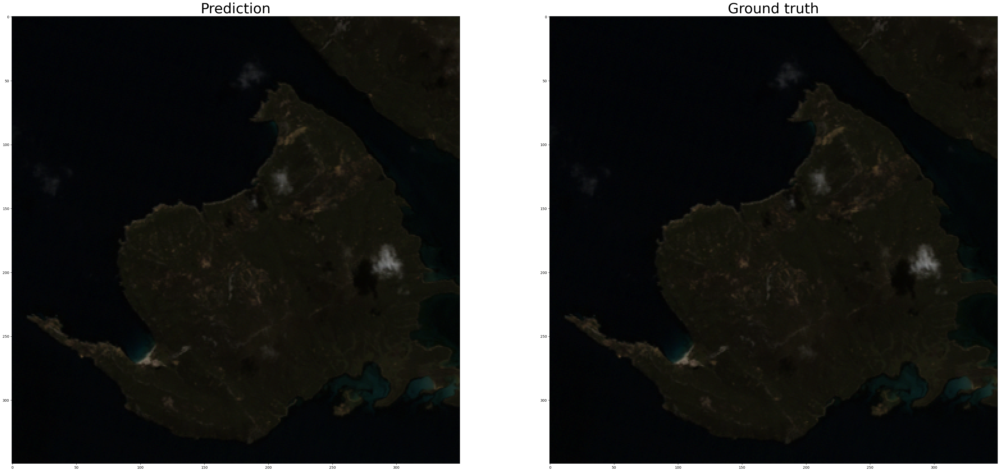

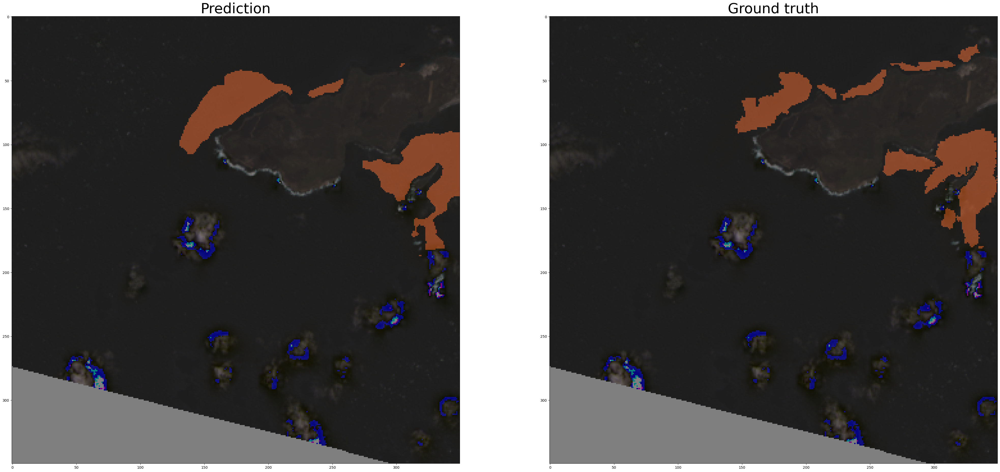

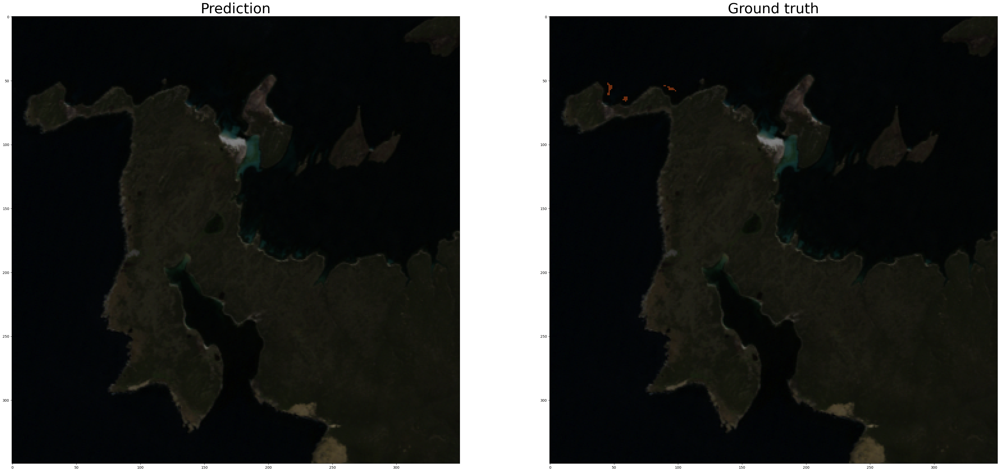

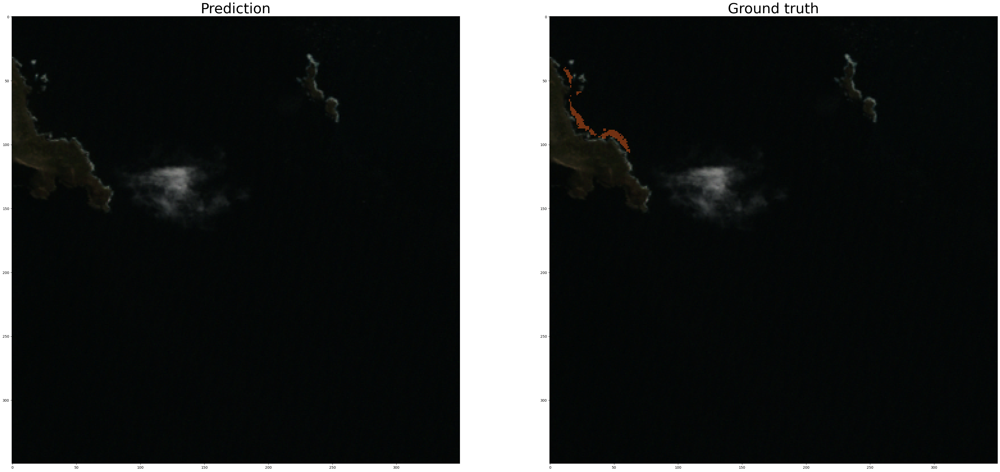

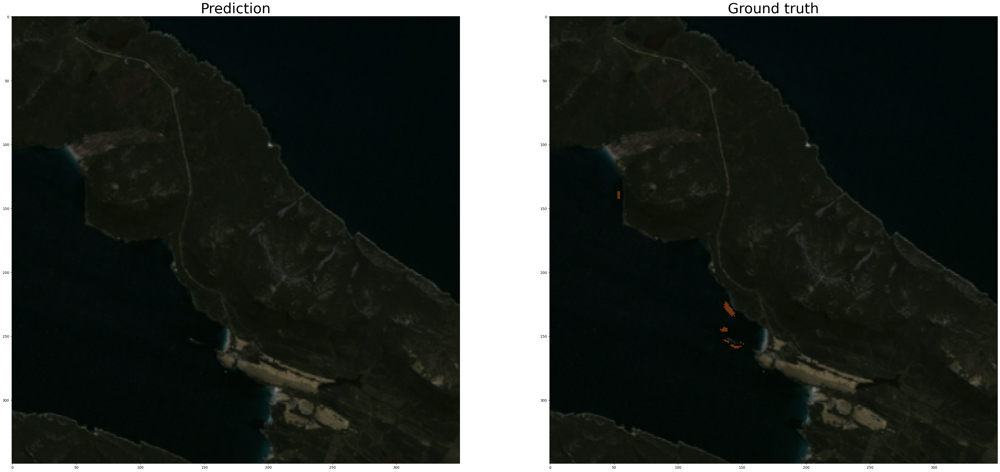

...

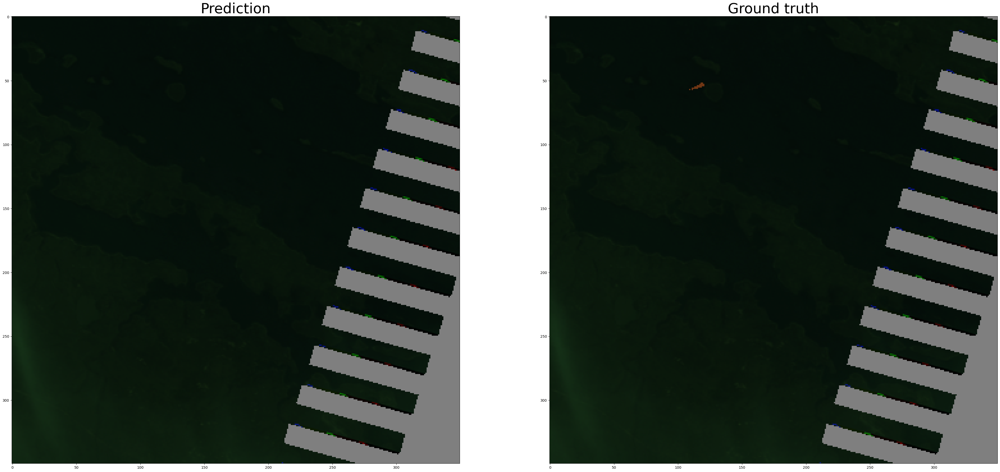

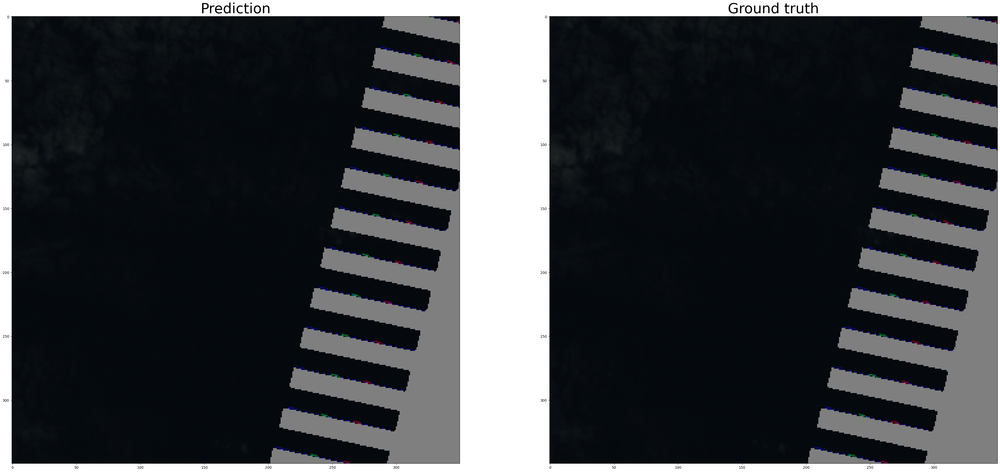

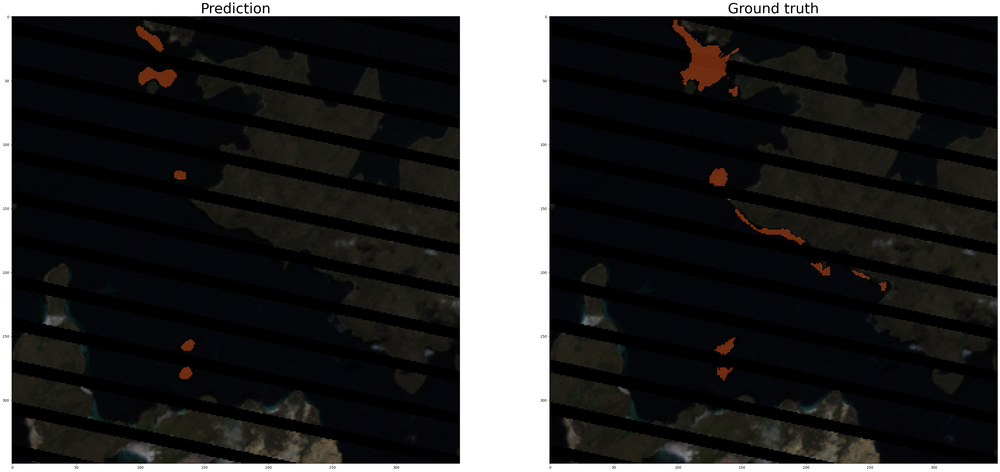

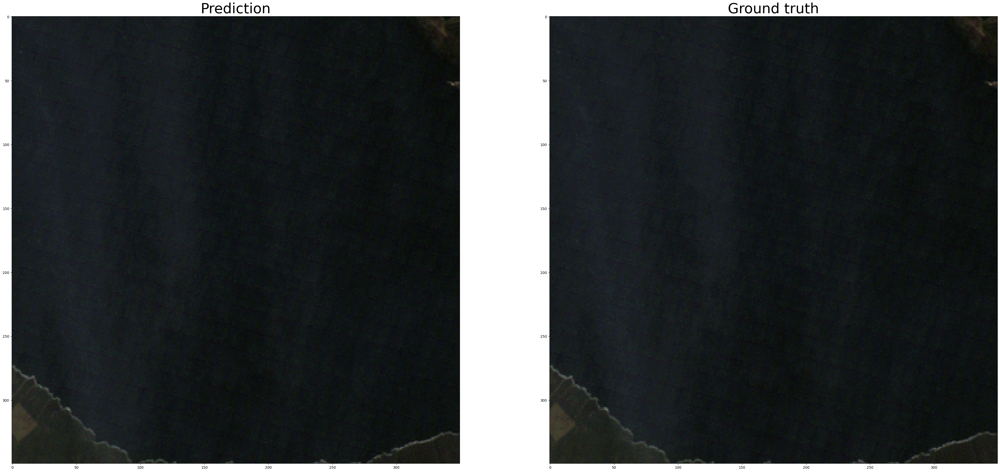

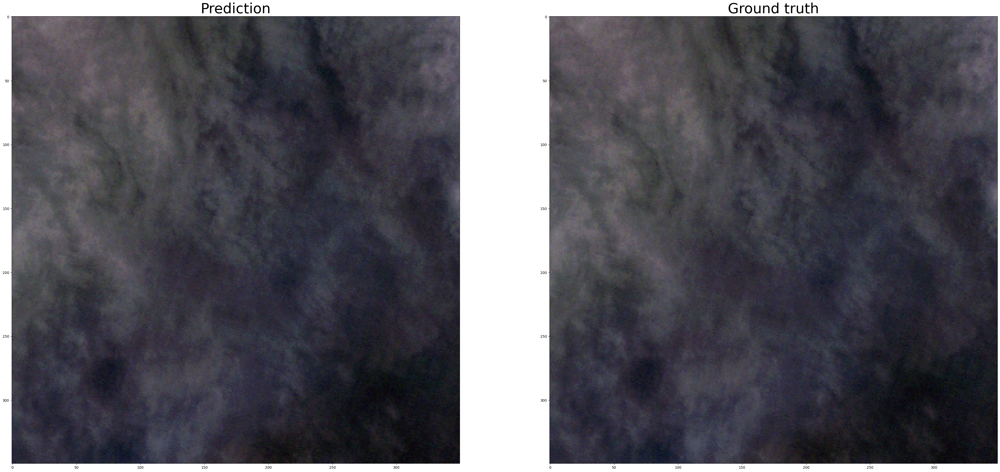

In [24]:
import matplotlib.pyplot as plt

for i in range(90,120):
    image = test_ds[i]['pixel_values']
    gt_seg = test_ds[i]['label']
    inputs = processor(images=image, return_tensors="pt")
    outputs = model(**inputs)
    logits = outputs.logits  # shape (batch_size, num_labels, height/4, width/4)

    # First, rescale logits to original image size
    upsampled_logits = nn.functional.interpolate(
        logits,
        size=image.size[::-1], # (height, width)
        mode='bilinear',
        align_corners=False
    )

    # Second, apply argmax on the class dimension
    pred_seg = upsampled_logits.argmax(dim=1)[0]

    pred_img = get_seg_overlay(image, pred_seg)
    
    gt_img = get_seg_overlay(image, np.array(gt_seg))

    f, axs = plt.subplots(1, 2)
    f.set_figheight(30)
    f.set_figwidth(50)

    axs[0].set_title("Prediction", {'fontsize': 40})
    axs[0].imshow(pred_img)
    axs[1].set_title("Ground truth", {'fontsize': 40})
    axs[1].imshow(gt_img)